In [1]:
import numpy as np
import requests
import json
import networkx as nx
import time
import matplotlib.pyplot as plt
from pprint import pprint
from matplotlib.collections import LineCollection
from fa2 import ForceAtlas2
from curved_edges import curved_edges

In [2]:
# Load token and self ID

my_token = open('./token.txt', 'r').read()[:-1]
my_id = 145170120

In [18]:
# Define colors for decoration

black_color = '#292c35ff'
yellow_color = '#dcae52ff'
yellow_dark_color = '#af7132ff'
white_color = '#e9e2c9ff'

In [4]:
# Get friends IDs and self data based on the requested fields

fields = 'sex, country, city, universities'

get_friends_str = 'https://api.vk.com/method/friends.get?user_id={}&v=5.21&fields={}&access_token={}'
get_friends_nofields_str = 'https://api.vk.com/method/friends.get?user_id={}&v=5.21&access_token={}'
get_my_str = 'https://api.vk.com/method/users.get?user_id={}&v=5.21&fields={}&access_token={}'

data_friends = requests.get(get_friends_str.format(my_id, fields, my_token)).json()['response']['items']
data_my = requests.get(get_my_str.format(my_id, fields, my_token)).json()['response']
ids_friends = requests.get(get_friends_nofields_str.format(my_id, my_token)).json()['response']['items']

data_all = data_my + data_friends
ids_all = [my_id] + ids_friends

In [5]:
# Store the friends separately

data_friends = data_all[1:]
ids_friends = ids_all[1:]

In [6]:
# Fill the graph of mutual friends

n_nodes_all = len(ids_all)
n_nodes_friends = n_nodes_all-1
mutual_matrix_all = np.zeros((n_nodes_all, n_nodes_all))
mutual_matrix_all[0] = np.full(n_nodes_all, 1)
mutual_matrix_all[:, 0] = np.full(n_nodes_all, 1)
get_mutual_str = 'https://api.vk.com/method/friends.getMutual?v=5.21?source_uid={}&target_uid={}&access_token={}'

for friend_id in ids_all[1:]:
    request_get = requests.get(get_mutual_str.format(my_id, friend_id, my_token)).json()
    if request_get.get('error'):
        time.sleep(3)
        request_get = requests.get(get_mutual_str.format(my_id, friend_id, my_token)).json()
    mutual_ids_all = request_get['response']
    for mutual_id in mutual_ids_all:
        friend_x = ids_all.index(friend_id)
        mutual_x = ids_all.index(mutual_id)
        mutual_matrix_all[friend_x, mutual_x] = 1
        mutual_matrix_all[mutual_x, friend_x] = 1

100%|██████████| 50/50 [00:00<00:00, 1749.52it/s]


BarnesHut Approximation  took  0.01  seconds
Repulsion forces  took  0.02  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


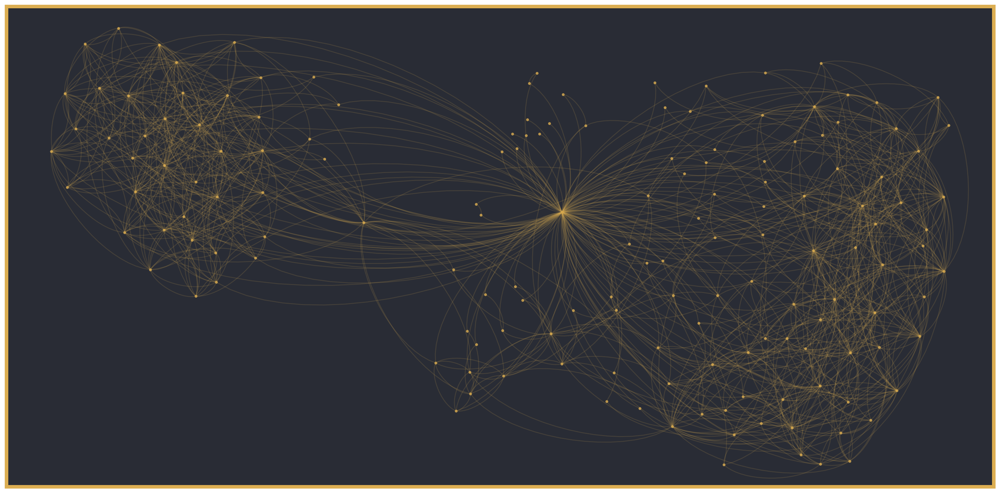

In [99]:
# Plot the graph of mutual friends

graph = nx.from_numpy_matrix(mutual_matrix_all)
pos = ForceAtlas2().forceatlas2_networkx_layout(graph, pos=None, iterations=50)
curves = curved_edges(graph, pos)
lc = LineCollection(curves, color=yellow_color, alpha=0.15, linewidths=1)

fig = plt.figure(figsize=(20, 10), dpi=200)
ax = fig.add_subplot(111)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(4)
    ax.spines[axis].set_color(yellow_color)

nx.draw_networkx_nodes(graph, pos, node_size=5, node_color=yellow_color, alpha=0.7)
plt.gca().set_facecolor(black_color)
plt.gca().add_collection(lc)
plt.show()

In [139]:
# Get the mutual friends except self and those who does not have the former

mutual_matrix_friends = mutual_matrix_all[1:, 1:]
delete_rowscols = []
for i in range(n_nodes_friends):
    if np.sum(mutual_matrix_friends[i]) <= 2:
        delete_rowscols.append(i)
mutual_matrix_friends_short = np.delete(mutual_matrix_friends, delete_rowscols, 0)
mutual_matrix_friends_short = np.delete(mutual_matrix_friends_short, delete_rowscols, 1)

100%|██████████| 50/50 [00:00<00:00, 2721.63it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


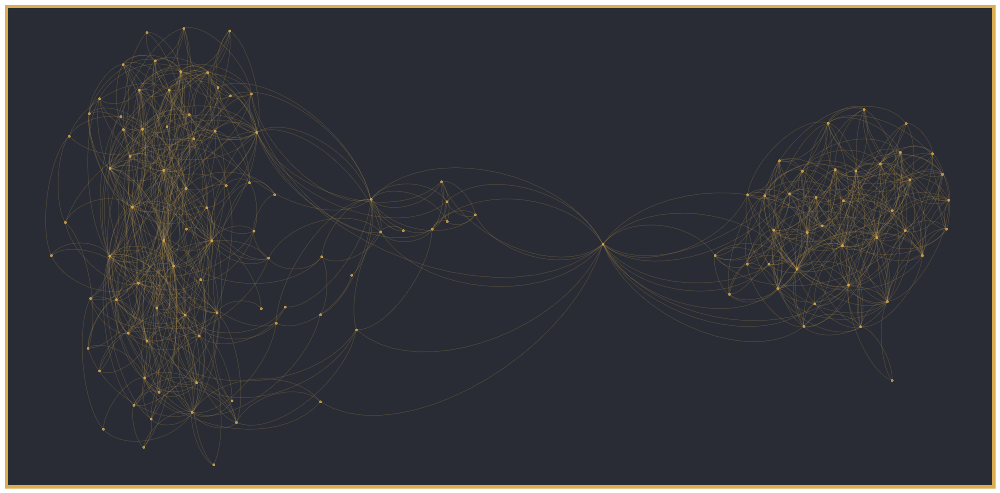

In [103]:
# Plot the new graph of mutual friends

graph = nx.from_numpy_matrix(mutual_matrix_friends_short)
pos = ForceAtlas2().forceatlas2_networkx_layout(graph, pos=None, iterations=50)
curves = curved_edges(graph, pos)
lc = LineCollection(curves, color=yellow_color, alpha=0.15, linewidths=1)

fig = plt.figure(figsize=(20, 10), dpi=200)
ax = fig.add_subplot(111)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(4)
    ax.spines[axis].set_color(yellow_color)

nx.draw_networkx_nodes(graph, pos, node_size=5, node_color=yellow_color, alpha=0.7)
plt.gca().set_facecolor(black_color)
plt.gca().add_collection(lc)
plt.show()

In [137]:
pprint(data_all[0])

{'city': {'id': 2, 'title': 'Санкт-Петербург'},
 'country': {'id': 1, 'title': 'Россия'},
 'first_name': 'Денис',
 'id': 145170120,
 'last_name': 'Ужва',
 'sex': 2,
 'universities': [{'city': 2,
                   'country': 1,
                   'faculty': 14,
                   'faculty_name': 'Физический факультет',
                   'id': 1,
                   'name': 'СПбГУ'},
                  {'city': 2,
                   'country': 1,
                   'faculty': 7,
                   'faculty_name': 'Математико-механический факультет',
                   'id': 1,
                   'name': 'СПбГУ'}]}


In [138]:
for agent in data_all:
    if agent['id'] == 0:
        pprint(agent)

In [129]:
# Counts for various categories

sex_titles = {1: 'female', 2: 'male'}
country_titles = {0: 'not specified'}
city_titles = {0: 'not specified'}
university_titles = {0: 'not specified'}

sex_count = {1: 0, 2: 0}
country_count = {0: 0}
city_count = {0: 0}
university_count = {0: 0}

for agent in data_all:

    agent_sex = agent['sex']
    sex_count[agent_sex] += 1

    agent_country = 0
    if agent.get('country'):
        agent_country = agent['country']['id']
        country_titles[agent_country] = agent['country']['title']
    if not country_count.get(agent_country):
        country_count[agent_country] = 0
    country_count[agent_country] += 1

    agent_city = 0
    if agent.get('city'):
        agent_city = agent['city']['id']
        city_titles[agent_city] = agent['city']['title']
    if not city_count.get(agent_city):
        city_count[agent_city] = 0
    city_count[agent_city] += 1

    agent_unis = []
    if agent.get('universities'):
        for agent_uni_data in agent['universities']:
            agent_uni = agent_uni_data['id']
            agent_unis.append(agent_uni)
            university_titles[agent_uni] = agent_uni_data['name']
            if not university_count.get(agent_uni):
                university_count[agent_uni] = 0
            university_count[agent_uni] += 1
    if len(agent_unis) == 0:
        university_count[0] += 1

In [130]:
# Adjacency matrices for various categories

sex_matrix = np.zeros((n_nodes_all, n_nodes_all))
country_matrix = np.zeros_like(sex_matrix)
city_matrix = np.zeros_like(sex_matrix)
university_matrix = np.zeros_like(sex_matrix)

for i, a1 in enumerate(data_all[:-1]):
    for j, a2 in enumerate(data_all[i+1:]):
        
        j = j + i + 1
        
        a1_sex = a1['sex']
        a2_sex = a2['sex']
        if a1_sex == a2_sex:
            sex_matrix[i, j] = 1
            
        a1_country = 0
        a2_country = 0
        if a1.get('country'):
            a1_country = a1['country']['id']
        if a2.get('country'):
            a2_country = a2['country']['id']
        if a1_country == a2_country:
            country_matrix[i, j] = 1
        
        a1_city = 0
        a2_city = 0
        if a1.get('city'):
            a1_city = a1['city']['id']
        if a2.get('city'):
            a2_city = a2['city']['id']
        if a1_city == a2_city:
            city_matrix[i, j] = 1
        
        a1_unis = []
        a2_unis = []
        if a1.get('universities'):
            for a1_uni_data in a1['universities']:
                a1_uni = a1_uni_data['id']
                a1_unis.append(a1_uni)
        if a2.get('universities'):
            for a2_uni_data in a2['universities']:
                a2_uni = a2_uni_data['id']
                a2_unis.append(a2_uni)
        if (len(a1_unis) == 0) and (len(a2_unis) == 0):
            university_matrix[i, j] = 1
        for a1_uni in a1_unis:
            for a2_uni in a2_unis:
                if a1_uni == a2_uni:
                    university_matrix[i, j] = 1
                    
sex_matrix += sex_matrix.T
country_matrix += country_matrix.T
city_matrix += city_matrix.T
university_matrix += university_matrix.T

[]

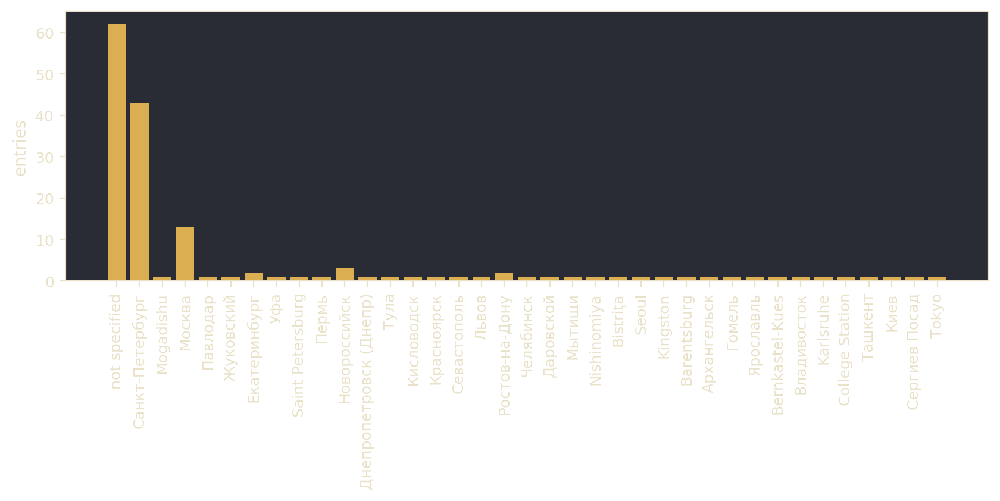

In [136]:
# City distribution

fig = plt.figure(figsize=(10, 3), dpi=200)
ax = fig.add_subplot(111)

ax.set_ylabel('entries', color=white_color, fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_color(white_color)
    
ax.tick_params(colors=white_color)

plt.gca().set_facecolor(black_color)
plt.bar(city_titles.values(), city_count.values(), color=yellow_color)
plt.xticks(rotation=90, fontsize=9, color=white_color)
plt.yticks(fontsize=9, color=white_color)
plt.axis(fc=white_color)
plt.plot()

100%|██████████| 50/50 [00:00<00:00, 2317.63it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


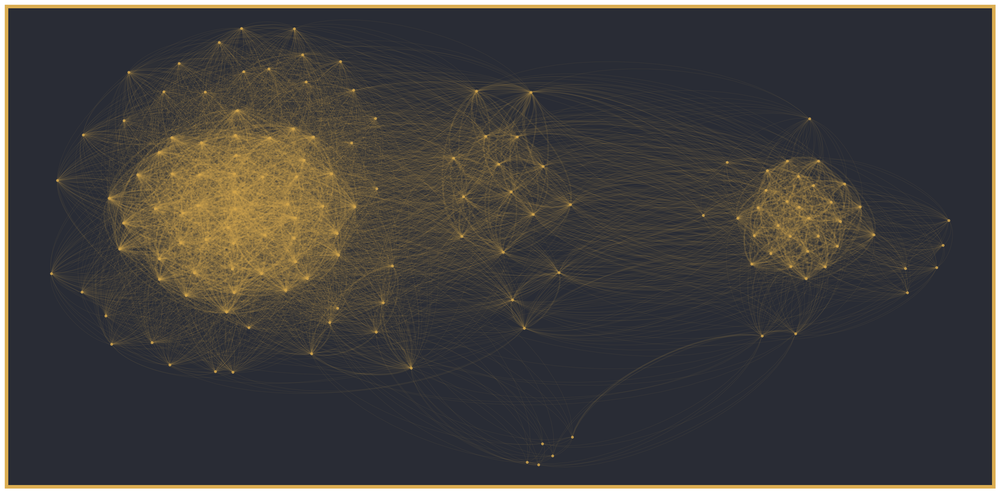

In [135]:
# Draw a weighted graph corresponding to multiplicity based on city and university 

adj_matrix = city_matrix + university_matrix
delete_rowscols = []
for i in range(n_nodes_friends):
    if np.sum(adj_matrix[i]) <= 2:
        delete_rowscols.append(i)
adj_matrix = np.delete(adj_matrix, delete_rowscols, 0)
adj_matrix = np.delete(adj_matrix, delete_rowscols, 1)

graph = nx.from_numpy_matrix(adj_matrix)
weights = np.array([x[2]['weight'] for x in graph.edges(data=True)])
widths = weights * weights * 0.4
pos = ForceAtlas2().forceatlas2_networkx_layout(graph, pos=None, iterations=50)
curves = curved_edges(graph, pos)
lc = LineCollection(curves, color=yellow_color, alpha=0.10, linewidths=widths)

fig = plt.figure(figsize=(20, 10), dpi=200)
ax = fig.add_subplot(111)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(4)
    ax.spines[axis].set_color(yellow_color)

nx.draw_networkx_nodes(graph, pos, node_size=5, node_color=yellow_color, alpha=0.7)
plt.gca().set_facecolor(black_color)
plt.gca().add_collection(lc)
plt.show()

100%|██████████| 50/50 [00:00<00:00, 20114.64it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


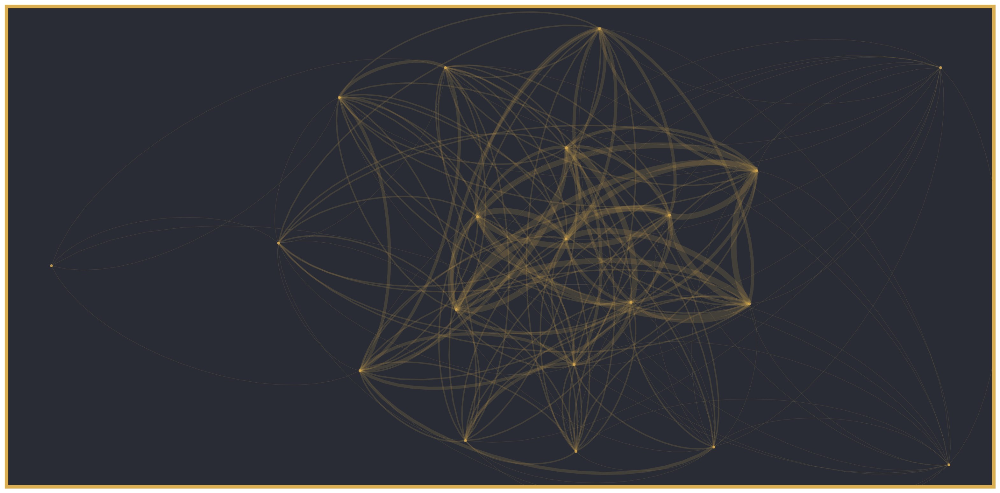

In [128]:
# Draw a weighted graph corresponding to multiplicity based on all four features for n friends

adj_matrix = sex_matrix + country_matrix + city_matrix + university_matrix

n = 20
adj_matrix = adj_matrix[:n, :n]

delete_rowscols = []
for i in range(n):
    if np.sum(adj_matrix[i]) <= 1:
        delete_rowscols.append(i)
adj_matrix = np.delete(adj_matrix, delete_rowscols, 0)
adj_matrix = np.delete(adj_matrix, delete_rowscols, 1)

graph = nx.from_numpy_matrix(adj_matrix)
weights = np.array([x[2]['weight'] for x in graph.edges(data=True)])
widths = weights * weights * 0.4
pos = ForceAtlas2().forceatlas2_networkx_layout(graph, pos=None, iterations=50)
curves = curved_edges(graph, pos)
lc = LineCollection(curves, color=yellow_color, alpha=0.15, linewidths=widths)

fig = plt.figure(figsize=(20, 10), dpi=200)
ax = fig.add_subplot(111)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(4)
    ax.spines[axis].set_color(yellow_color)

nx.draw_networkx_nodes(graph, pos, node_size=5, node_color=yellow_color, alpha=0.7)
plt.gca().set_facecolor(black_color)
plt.gca().add_collection(lc)
plt.show()